#### NOTE: This coursework did a data analysis and predictive modeling using Pandas and Scikit-learn packages.

## Data Analysis and Predictive Modeling on Census data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
#load in data
#na_values='?' is for missing value
adult = pd.read_csv('~/desktop/adult-modified.csv',na_values=["?"]) 
adult.head()

,age,workclass,education,marital-status,race,sex,hours-per-week,income
0,39.0,Public,13,Single,White,Male,40,<=50K
1,50.0,Self-emp,13,Married,White,Male,13,<=50K
2,38.0,Private,9,Single,White,Male,40,<=50K
3,53.0,Private,7,Married,Black,Male,40,<=50K
4,28.0,Private,13,Married,Black,Female,40,<=50K


In [3]:
adult.shape

(10000, 8)

### 3a-1.Examine the data for missing values

In [4]:
#find out columns having missing values: Age and workclass
adult.isnull().any()

age                True
workclass          True
education         False
marital-status    False
race              False
sex               False
hours-per-week    False
income            False
dtype: bool

In [5]:
#For numerical attribute 'age'
#fill in the missing values using the attribute mean
age_mean = adult.age.mean()
adult.age.fillna(age_mean, axis=0, inplace=True)

#For categorical attribute 'workclass'
#Remove instances with missing values
adult.dropna(axis=0, inplace=True)

In [6]:
adult.shape

(9412, 8)

In [7]:
#check if there are still missing values
adult.isnull().any()

age               False
workclass         False
education         False
marital-status    False
race              False
sex               False
hours-per-week    False
income            False
dtype: bool

### 3a-2.Examine the characteristics of the attributes

In [8]:
#data types check
#numarical attributes: age,hours-per-week 
#catagorical attributes: education, workclass, marital-status, race, sex, income
#Note: even though 'education'looks like numerical attributes, it's ordinal variable which means each number of it 
#      represent a specific level, so we here I consider it as categorical attributes.
adult.dtypes

age               float64
workclass          object
education           int64
marital-status     object
race               object
sex                object
hours-per-week      int64
income             object
dtype: object

In [9]:
### transfrom 'education' to categorical type
adult["education"] = adult["education"].astype('category')

In [10]:
adult.describe(include='all')

,age,workclass,education,marital-status,race,sex,hours-per-week,income
count,9412.000000,9412,9412.0,9412,9412,9412,9412.000000,9412
unique,NaN,3,16.0,2,5,2,NaN,2
top,NaN,Private,9.0,Married,White,Male,NaN,<=50K
freq,NaN,6947,3065.0,4737,8062,6383,NaN,7093
mean,38.366342,NaN,NaN,NaN,NaN,NaN,41.080217,NaN
std,12.962039,NaN,NaN,NaN,NaN,NaN,11.884590,NaN
min,17.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN
25%,28.000000,NaN,NaN,NaN,NaN,NaN,40.000000,NaN
50%,37.000000,NaN,NaN,NaN,NaN,NaN,40.000000,NaN
75%,47.000000,NaN,NaN,NaN,NaN,NaN,45.000000,NaN


In [11]:
###For Numeric attributes:'age', 'hours-per-week' 
# Descriptive Statistics for three Numerical Attributes
adult[["age","hours-per-week"]].describe()

,age,hours-per-week
count,9412.000000,9412.000000
mean,38.366342,41.080217
std,12.962039,11.884590
min,17.000000,1.000000
25%,28.000000,40.000000
50%,37.000000,40.000000
75%,47.000000,45.000000
max,90.000000,99.000000


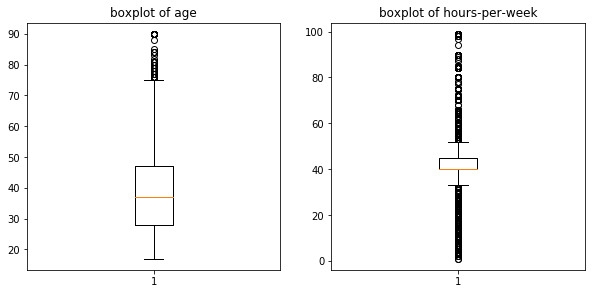

In [12]:
#box plot
fig = plt.figure(figsize=(10, 10))
ax1 = fig.add_subplot(2,2,1) 
ax1.boxplot(adult['age'])
ax1.set_title("boxplot of age")
ax2 = fig.add_subplot(2,2,2)
ax2.boxplot(adult['hours-per-week'])
ax2.set_title("boxplot of hours-per-week")

plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11c74bb90>,
      dtype=object)

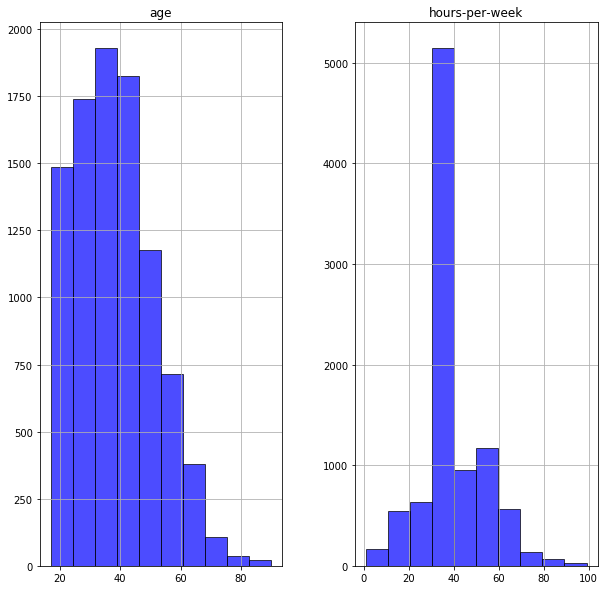

In [13]:
#histogram
plt.figure()
adult[['age','hours-per-week']].hist(color='blue',alpha=0.7, edgecolor = "black",figsize=(10, 10) )

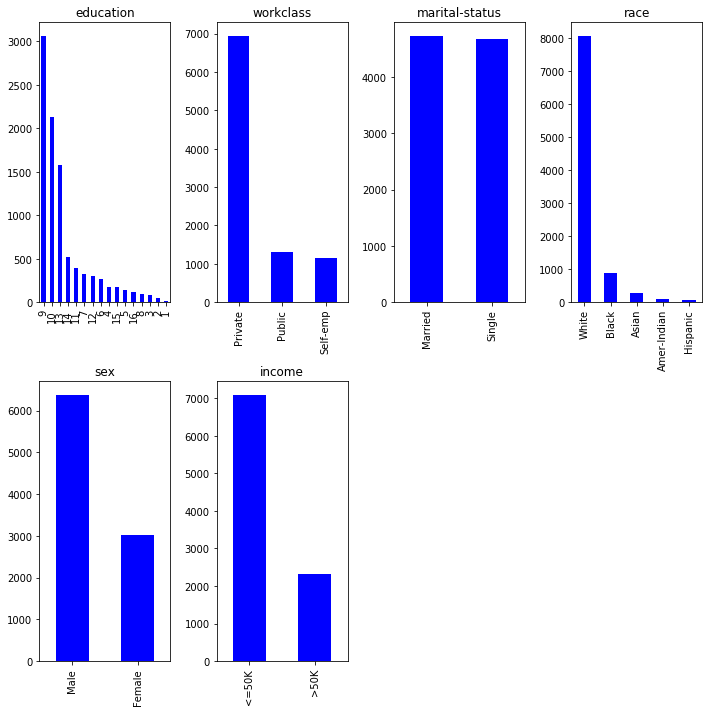

In [14]:
#bar graphs
#bar plot
a=['education','workclass','marital-status','race','sex','income']
fig = plt.figure(figsize=(10, 10))
for i in range(len(a)):
    
    ax=fig.add_subplot(2,4,i+1)
    ax.set_title(a[i])
    adult[a[i]].value_counts().plot(kind='bar',color='blue')
fig.tight_layout()
plt.show()

From graphs above, we can see that in this dataset, most people are White male under 45 with education in level 9,10,13 and 14 and working 30-40 hours a week with income under 50k. Their work class is in private, marital status for married and single is in half and half. In general, other than marital status, all attributes has skew on distributions.

### 3a-3.Perform the following cross-tabulations (including generating bar charts): education+race, work-class+income, work-class+race, and race+income.

In [15]:
from IPython.display import display

#Crosstab of education + race and bar chart
edu_race = pd.crosstab(adult["education"], adult["race"])
edu_race

race,Amer-Indian,Asian,Black,Hispanic,White
education,,,,,
1,0,0,1,0,11
2,0,1,4,3,38
3,0,4,5,1,71
4,5,5,14,6,150
5,0,3,19,2,118
6,8,3,30,4,223
7,4,6,49,4,261
8,0,2,17,3,78
9,35,67,350,23,2590


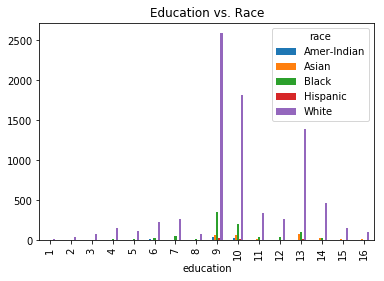

In [16]:
plt.show(edu_race.plot(kind="bar", title="Education vs. Race"))

In [17]:
#Crosstab of work-class + income and bar chart
workcls_income = pd.crosstab(adult["workclass"], adult["income"])
workcls_income

income,<=50K,>50K
workclass,,
Private,5443,1504
Public,925,392
Self-emp,725,423


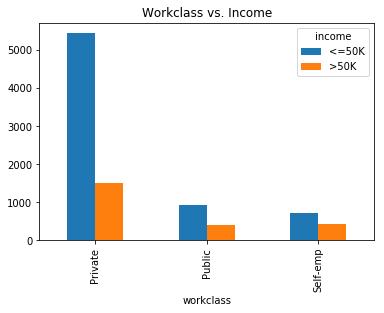

In [18]:
plt.show(workcls_income.plot(kind="bar", title="Workclass vs. Income"))

In [19]:
#Crosstab of work-class + race and bar chart

workcls_race = pd.crosstab(adult["workclass"], adult["race"])
workcls_race

race,Amer-Indian,Asian,Black,Hispanic,White
workclass,,,,,
Private,65,204,664,64,5950
Public,20,48,192,5,1052
Self-emp,7,39,36,6,1060


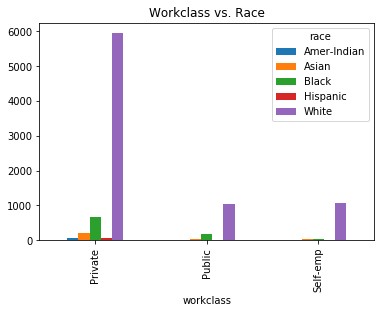

In [20]:
plt.show(workcls_race.plot(kind="bar", title="Workclass vs. Race"))

In [21]:
#Crosstab of race + income and bar chart

race_inc = pd.crosstab(adult["race"], adult["income"])
race_inc

income,<=50K,>50K
race,,
Amer-Indian,83,9
Asian,224,67
Black,773,119
Hispanic,69,6
White,5944,2118


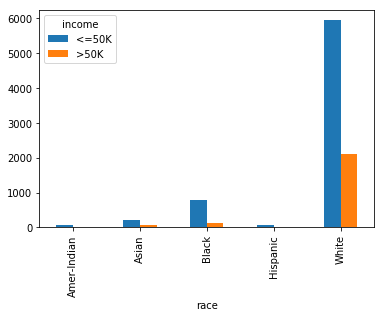

In [22]:
plt.show(race_inc.plot(kind="bar"))

In [23]:
# table showing percentages of each race category that fall in the low-income group
race_lowinc_tab = pd.crosstab(adult.race, adult.income).apply(lambda r: r/r.sum()*100, axis=1)
race_lowinc_tab

income,<=50K,>50K
race,,
Amer-Indian,90.217391,9.782609
Asian,76.975945,23.024055
Black,86.659193,13.340807
Hispanic,92.000000,8.000000
White,73.728603,26.271397


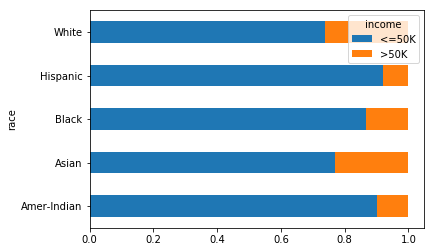

In [24]:
# bar chart showing percentages of each race category that fall in the low-income group
race_lowinc= pd.crosstab(adult['race'],adult['income']).apply(lambda x: x/x.sum(), 1)
plt.show(race_lowinc.plot.barh(stacked=True))

race       Amer-Indian     Asian      Black  Hispanic      White
education                                                       
1             0.000000  0.000000   8.333333  0.000000  91.666667
2             0.000000  2.173913   8.695652  6.521739  82.608696
3             0.000000  4.938272   6.172840  1.234568  87.654321
4             2.777778  2.777778   7.777778  3.333333  83.333333
5             0.000000  2.112676  13.380282  1.408451  83.098592
6             2.985075  1.119403  11.194030  1.492537  83.208955
7             1.234568  1.851852  15.123457  1.234568  80.555556
8             0.000000  2.000000  17.000000  3.000000  78.000000
9             1.141925  2.185971  11.419250  0.750408  84.502447
10            1.223529  3.011765   9.694118  0.517647  85.552941
11            1.285347  2.570694   8.483290  1.028278  86.632391
12            1.315789  1.644737  10.855263  0.986842  85.197368
13            0.317058  4.755866   6.467977  0.507292  87.951807
14            0.000000  5

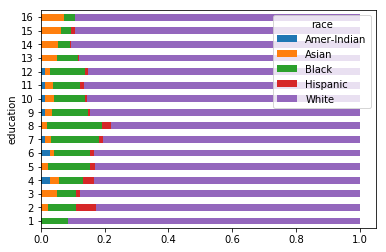

None


In [25]:
#appendix I: table showing percentages of each race category that fall in different education level levels
edu_race_tab = pd.crosstab(adult.education, adult.race).apply(lambda r: r/r.sum()*100, axis=1)
print edu_race_tab

#appendix II: bar chart showing percentages of each race category that fall in different education level levels
edu_race= pd.crosstab(adult['education'],adult['race']).apply(lambda x: x/x.sum(), 1)
print plt.show(edu_race.plot.barh(stacked=True))

From the graphs above, we can see that white people and people with income under 50k are the majorities. <br>
In general, for race performancing in workclass and income, the population level from high to low is: White> Black> Asian> Amer-Indian> Hispanic. That maybe effected by population of each race; for income performancing in workclass, no matter in which workclass where the population level from high to low is: private> public > self-emp, people have income under 50k always take the majority. <br>
For the last bar chart showing percentages of each race category that fall in the low-income group, we can see that actually White and Asian have less low-income people while Black, Amer-Indian and Hispanic have more. That maybe related to education level. As we can see in the appendix graph which shows percentages of each race in different education levels, in real high education levels which are between 14-16, White and Asian takes the most part of percentages. For Blake, some of them have high education levels but most of them are in level 7,8,12 which are not that high. For Hispanic and Amer-Indian, Hispanic has more people in low education levels than Amer-Indian. 

### 3a-4: Compare and contrast the characteristics of the low-income and high-income categories across the different attributes. 

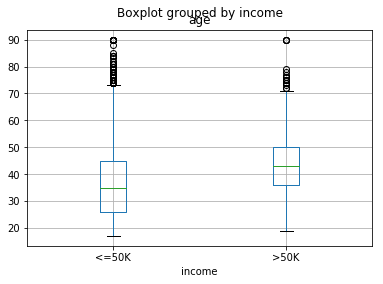

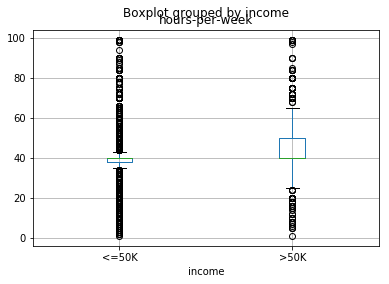

In [26]:
#Compare and contrast accross numarical variables
fig = plt.figure(figsize=(10, 10))

a= adult.boxplot(column= 'age',by='income')
b= adult.boxplot(column= 'hours-per-week',by='income')

plt.show()

From the graphs above, we can see that people with high-income are usually older, and have more working hours-per-week through the mean values conparation.(For hours-per-week, we infer this conclusion based on quartiles range.)

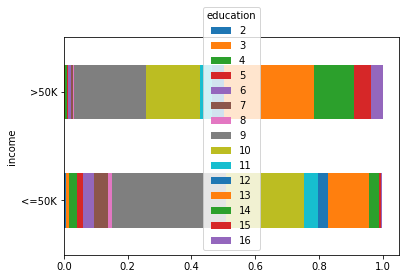

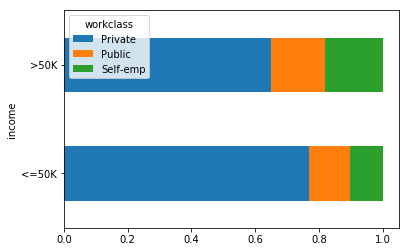

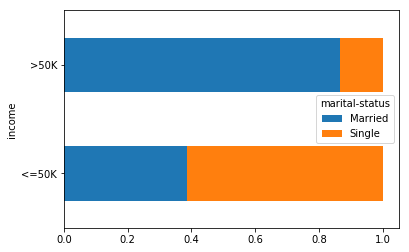

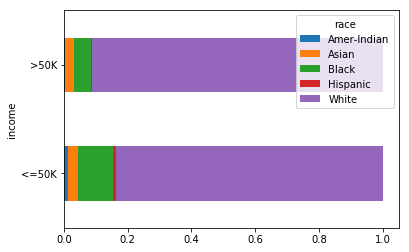

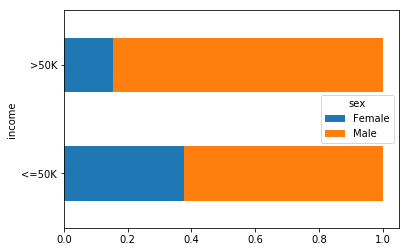

In [27]:
#Compare and contrast accross categorical variables

cls = ['education','workclass','marital-status','race','sex']
for i in cls:
    pd.crosstab(adult["income"],adult[i]).apply(lambda x: x/x.sum(), 1).plot.barh(stacked=True)

Since we have discussed income across different attributes in last question(3a-3) which indicates that people with income <=50k is much more than people with income >50k, I'm going to talk about percentages that people with high and low income take across differnt categorical atrributes. <br>
In 'Income vs. education', high-incomes usually have higher education than low-incomes. Education from 10-16 levels takes more persentages in high-incomes than that in low-incomes.
In 'Income vs. Workclass', private class is the majority in both income levels, but high-income people are more likely to be in self-employed class than low-income.<br>
In ' Income vs. Marial-status', high-income people are more likely be married while low-incomes are more likely to be single. <br>
In ' Income vs. Race' , because of population advantage, the White take majorities of both high and low incomes, at the same time,  the Black looks more likely to be in low income.<br>
In 'Income vs. Sex', male looks easier to get high income than female. <br>
Above all, we assume that high-incomes are likely to be these middle-aged marriage male entrepreneur who are self-employed and with high education level.

### 3b.Predictive Modeling and Model Evaluation

#### 3b-1. Using either Pandas or Scikit-learn, create dummy variables for the categorical attributes. Then separate the target attribute ("income>50K") from the attributes used for training. 

In [28]:
adult.head()

,age,workclass,education,marital-status,race,sex,hours-per-week,income
0,39.0,Public,13,Single,White,Male,40,<=50K
1,50.0,Self-emp,13,Married,White,Male,13,<=50K
2,38.0,Private,9,Single,White,Male,40,<=50K
3,53.0,Private,7,Married,Black,Male,40,<=50K
4,28.0,Private,13,Married,Black,Female,40,<=50K


In [29]:
#create dummies
adult_matrix = pd.get_dummies(adult[['age', 'education','workclass','marital-status','race','sex','hours-per-week','income']])
adult_matrix.head(10)

,age,hours-per-week,education_1,education_2,education_3,education_4,education_5,education_6,education_7,education_8,...,marital-status_Single,race_Amer-Indian,race_Asian,race_Black,race_Hispanic,race_White,sex_Female,sex_Male,income_<=50K,income_>50K
0,39.0,40,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,1,0
1,50.0,13,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,1,0
2,38.0,40,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,1,1,0
3,53.0,40,0,0,0,0,0,0,1,0,...,0,0,0,1,0,0,0,1,1,0
4,28.0,40,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,1,0
5,37.0,40,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,1,0
6,49.0,16,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,1,0,1,0
7,52.0,45,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,1
8,31.0,50,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,1,0,0,1
9,42.0,40,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,1


In [30]:
#Drop out all the 'income_<=50K' column
adult_dummies_50=adult_matrix.drop('income_<=50K',axis=1)
print adult_dummies_50.shape
print adult_dummies_50.head(5)

(9412, 31)
    age  hours-per-week  education_1  education_2  education_3  education_4  \
0  39.0              40            0            0            0            0   
1  50.0              13            0            0            0            0   
2  38.0              40            0            0            0            0   
3  53.0              40            0            0            0            0   
4  28.0              40            0            0            0            0   

   education_5  education_6  education_7  education_8     ...       \
0            0            0            0            0     ...        
1            0            0            0            0     ...        
2            0            0            0            0     ...        
3            0            0            1            0     ...        
4            0            0            0            0     ...        

   marital-status_Married  marital-status_Single  race_Amer-Indian  \
0                      

In [31]:
#Extract the Class / target column from the main table
adult_target=adult_dummies_50['income_>50K']
adult_target.shape

(9412,)

In [32]:
#Drop the target column'income_>50K' from the table
adult_dummies_50.drop('income_>50K',axis=1,inplace=True)
adult_dummies_50.shape

(9412, 30)

In [33]:
adult_dummies_50.head(5)

,age,hours-per-week,education_1,education_2,education_3,education_4,education_5,education_6,education_7,education_8,...,workclass_Self-emp,marital-status_Married,marital-status_Single,race_Amer-Indian,race_Asian,race_Black,race_Hispanic,race_White,sex_Female,sex_Male
0,39.0,40,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
1,50.0,13,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,1
2,38.0,40,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
3,53.0,40,0,0,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,0,1
4,28.0,40,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,1,0


In [34]:
adult_dummies_50_name = adult_dummies_50.columns.values
adult_dummies_50_name

array(['age', 'hours-per-week', 'education_1', 'education_2',
       'education_3', 'education_4', 'education_5', 'education_6',
       'education_7', 'education_8', 'education_9', 'education_10',
       'education_11', 'education_12', 'education_13', 'education_14',
       'education_15', 'education_16', 'workclass_Private',
       'workclass_Public', 'workclass_Self-emp', 'marital-status_Married',
       'marital-status_Single', 'race_Amer-Indian', 'race_Asian',
       'race_Black', 'race_Hispanic', 'race_White', 'sex_Female',
       'sex_Male'], dtype=object)

In [35]:
#seperate training and testing
from sklearn.cross_validation import train_test_split
adult_train, adult_test, adult_target_train, adult_target_test = train_test_split(adult_dummies_50, adult_target, test_size=0.2, random_state=888)

#np.set_printoptions(precision=4, linewidth=80, suppress=True)
print (adult_test.shape)
print (adult_target_test.shape)
#print (adult_test[0:5])
print (adult_train.shape)
print (adult_target_train.shape)
#print (adult_train[0:5])

(1883, 30)
(1883,)
(7529, 30)
(7529,)


/Users/Alexkilledme/anaconda2/lib/python2.7/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


### 3b-2. Use scikit-learn to build classifiers uisng Naive Bayes (Gaussian), decision tree (using "entropy" as selection criteria), and linear discriminant analysis (LDA). For each perform 10-fold cross validation and report average accuracy.

In [36]:
### normalize
from sklearn import preprocessing, cross_validation, neighbors, tree, naive_bayes
from sklearn.metrics import classification_report, confusion_matrix

In [37]:
min_max_scaler = preprocessing.MinMaxScaler().fit(adult_train)
adult_train_norm = min_max_scaler.fit_transform(adult_train)
adult_test_norm = min_max_scaler.fit_transform(adult_test)
adult_dummies_50_norm = np.vstack((adult_train_norm,adult_test_norm))

In [38]:
adult_target_train = np.array(adult_target_train)
adult_target_test = np.array(adult_target_test)
adult_target = np.array(adult_target)

In [39]:
### Naive Bayes

In [40]:
nbclf = naive_bayes.GaussianNB()
nbclf = nbclf.fit(adult_train, adult_target_train)
nbpreds_test = nbclf.predict(adult_test)
print(nbpreds_test)

[0 1 1 ... 1 0 1]


In [41]:
print "Score on Training: " + str(nbclf.score(adult_train_norm, adult_target_train))
print "Score on Test: " + str(nbclf.score(adult_test_norm, adult_target_test))

Score on Training: 0.7476424491964404
Score on Test: 0.7302177376526819


In [42]:
#10-fold Cross Validation
from sklearn import cross_validation
NBcv_scores = cross_validation.cross_val_score(nbclf, adult_dummies_50, adult_target, cv=10)
print NBcv_scores
print('Overall Average accuracy: %f +/- %f'%(NBcv_scores.mean(),NBcv_scores.std()))

[0.52866242 0.51592357 0.4522293  0.56110521 0.54516472 0.53560043
 0.54835282 0.5685441  0.52178533 0.54893617]
Overall Average accuracy: 0.532630 +/- 0.031075


In [43]:
### decision tree with entropy

In [44]:
treeclf = tree.DecisionTreeClassifier(criterion='entropy')
treeclf = treeclf.fit(adult_train, adult_target_train)

In [45]:
treeTestScore = treeclf.score(adult_test_norm, adult_target_test)
treeTrainScore = treeclf.score(adult_train_norm, adult_target_train)

In [46]:
print "Score on Training: " + str(treeclf.score(adult_test_norm, adult_target_test))
print "Score on Test: "  + str(treeclf.score(adult_train_norm, adult_target_train))

Score on Training: 0.7615507169410515
Score on Test: 0.7554788152477089


In [47]:
#10-fold Cross-Validation 
treecv_scores = cross_validation.cross_val_score(treeclf, adult_dummies_50, adult_target, cv=10)
print treecv_scores
print('Overall Average accuracy: %f +/- %f'%(treecv_scores.mean(),treecv_scores.std()))

[0.77494692 0.77070064 0.76857749 0.76833156 0.75664187 0.75345377
 0.74920298 0.78108395 0.78320935 0.77340426]
Overall Average accuracy: 0.767955 +/- 0.010870


In [48]:
###LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [49]:
ldclf = LinearDiscriminantAnalysis()
ldclf = ldclf.fit(adult_train, adult_target_train)

/Users/Alexkilledme/anaconda2/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


In [50]:
print "Score on Training: " +str(ldclf.score(adult_train, adult_target_train))
print "Score on Test: " + str(ldclf.score(adult_test, adult_target_test))

Score on Training: 0.8132554124053659
Score on Test: 0.807222517259692


In [51]:
#10-fold Cross-Validation 
LDAcv_scores = cross_validation.cross_val_score(ldclf, adult_dummies_50, adult_target, cv=10)
print LDAcv_scores
print ('Overall Average accuracy: %f +/- %f' % (LDAcv_scores.mean(), LDAcv_scores.std()*2))

[0.81316348 0.7940552  0.79087049 0.82465462 0.81296493 0.80233794
 0.80871413 0.81827843 0.82996812 0.81808511]
Overall Average accuracy: 0.811309 +/- 0.023913


### 3b-3. For the decision tree model (generated on the full training data), generate a visualization of tree and submit it as a separate file (png, jpg, or pdf) or embed it in the Jupyter Notebook.

In [52]:
!pip install graphviz

You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [53]:
from sklearn.tree import export_graphviz
export_graphviz(treeclf,out_file='dtree.dot', feature_names=adult_train.columns)

In [54]:
import graphviz

with open("dtree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

In [55]:
from os import system
system('dot -Tpng dtree.dot -o dtree.png')

0

In [56]:
from IPython.display import Image
Image(filename='dtree.png', width=800)